<img src="https://s8.hostingkartinok.com/uploads/images/2018/08/308b49fcfbc619d629fe4604bceb67ac.jpg" width=500, height=450>
<h3 style="text-align: center;"><b>Физтех-Школа Прикладной математики и информатики (ФПМИ) МФТИ</b></h3>

---

<h2 style="text-align: center;"><b>Детектирование объектов с помощью YOLOv3</b></h2>

<img src="https://i.ytimg.com/vi/s8Ui_kV9dhw/maxresdefault.jpg" width=600 height=450>

<h4 style="text-align: center;"><b>Составитель: Илья Захаркин (ФИВТ МФТИ, NeurusLab). По всем вопросам в Telegram: <a>@ilyazakharkin</a></b></h4>

На семинаре мы запускали SSD и Mask-RCNN из Tensorflow Object Detection API. На лекции же подробно разбирался алгоритм YOLOv3, давайте же теперь этот самый детектор и попробуем применить на практике.

<h2 style="text-align: center;"><b>YOLOv3</b></h2>

**Идея детекторов:** использовать сильную свёрточную нейросеть, натренированную на классификации, чтобы извлечь признаки из изображения, потом использовать свёрточные слои для регрессии точек боксов и классификации объектов внутри них.

Напомним, что архитектура у YOLOv3 следующая:

<img src="https://camo.githubusercontent.com/5c561504c1b01ee565764785efe5572156d4cd61/68747470733a2f2f692e696d6775722e636f6d2f546f45626c6a5a2e706e67">

Словами:

1. Картинка подаётся на вход
2. Она сжимается до размера 300х300х3
3. Пропускается через backbone-нейросеть, которая извлекает признаки -- *Darknet53*
4. Идут несколько свёрточных слоёв со свёртками 1х1 и 3х3
5. После них идёт yolo-слой: свёртка 1х1х(1 + 4 + NUM_CLASSES)
6. Далее происходит upsampling (увеличение по ширине и высоте) в 2 раза и конкатенация с feature map'ами, которые были до upsampling'а (чтобы улучшить качество)
7. Шаги 4-6 повторяются ещё 2 раза, чтобы улучшить качество детектирования мелких объектов

При обучении также: 
8. Финальный feature map специальным образом подаётся в Loss для подсчёта ошибки
9. Распространятся градиенты, как в обычном backpropagation, обновляются веса сети

В слоях используются LeakyReLU активации. Перед YOLO-слоями используются линейные активации (то есть нет нелинейности).

Как вся архитектура выглядит в коде вы можете посмотреть в этом файле: https://github.com/akozd/tensorflow_yolo_v3/blob/master/models/yolo_v3.py

Оригинальная статья с arxiv.org: https://arxiv.org/abs/1804.02767

***Примечание:*** Вы можете спросить: "Почему именно YOLOv3, ведь много других хороших детекторов?". Да, но на данный момент у YOLOv3 лучшее соотношение скорость/качество из широко применяемых нейросетевых детекторов. В этом плане он State-of-the-Art.

<h2 style="text-align: center;"><b>Задание (10 баллов)</b></h2>

***Предполагается, что Вы знакомы с TensorFlow и  свёрточными нейросетями***

Лучше выполнять этот ноутбук локально, поставив TensorFlow: `pip install tensorflow` (CPU-версия, но слишком долго работать не будет, так как обучения в задании нет, только предсказание).

Если Вы выполняете на Google Colab, то будьте готовы активно использовать переходы в подпапки (`os.chdir(*path*)`), как было на семинаре.

<img src="http://blog.yavuzz.com/image.axd?picture=/resimler/sayit.jpg">

Писать свой нейросетевой детектор с нуля -- весьма непростая задача, поэтому сейчас просто используем код человека, который смог: https://github.com/akozd/tensorflow_yolo_v3

Напомню, что скачать с Github весь репозиторий можно командой: `git clone *адрес репозитория*`. Например, репозиторий, который нужен в этом задании, скачивается так: `git clone https://github.com/akozd/tensorflow_yolo_v3`

### Этап 1 (2 балла): первичное ознакомлене с репозиторием

Прочитать README этого репозитория: https://github.com/akozd/tensorflow_yolo_v3

***Вопрос по `README.md` (1 балл)***: что автор репозитория предлагает для того, чтобы улучшить качество предсказания боксов пр обучении на собственных данных?

Ответ:

For best results during training on a custom dataset, you will have to generate new anchors using a k-means algorithm on box width and heights in your training data. Code is not provided to do this. Using the default anchors from the COCO dataset should be sufficient for the majority of cases.

***Предлагается сгенерировать новые "якоря" с использованием алгорится k-means***

In [0]:
...

Прочитайте файл `train.py`

***Вопрос по `train.py` (1 балл)***: за что отвечает аргумент скрипта `train.py` под названием `--test_model_overfit`?

Ответ:
'--test_model_overfit', nargs='?', default=False, type=str2bool, const=True,
help='Whether or not to purposefully overfit the model by training it on only one image. This option is useful in testing out if the loss function is working correctly.')

***Следует ли переобучать модель на одном изображении.***

In [0]:
...

### Этап 2 (3 балла): чтение кода репозитория

Теперь нужно прочитать код автора и понять, что в нём происходит. Этот репозиторий был выбран не спроста -- весь код хорошо документирован и исправно работает.  

Ваша задача состоит в том, чтобы понять, как связаны файлы друг с другом, какие файлы используются для обучения, какие для предсказания, какие вовсе не используются. Хорошая стратегия: основываясь на README.md начать разбираться с тем, как работает `detect.py`, то есть что принимает на вход и что на выход, какие сторонние файлы использует.

<img src="https://thefreshtoast.com/wp-content/uploads/2017/02/bbc-new-meme-hood-documentary.jpg" width=500 height=300>

***Задача (3 балла)***: подробно опишите структуру репозитория, пояснив, для чего нужен каждый файл. Чем более подробно вы опишите, что происходит внутри файла (можно прямо в виде "..в строчках 15-20 производится предсказание боксов по изображению.."), тем больше баллов получите.

***Не подробное описание репозитория.***

**/detect.py**

строки 1-7 - импорт библиотек
строки 12-47 - парсятся аргументы из запроса командной строки и собираются в переменной args
строки 49-59 - задаются высота, ширина картинок, якорь, классы, определяется изображение
строка 61 - сброс графа по умолчанию
строки 64-70 - построение графа (yolo_v3.py из папки models)
строки 73-86 - прогон модели
строки 89-91 - отрисовка боксов на изображения с помощью инструментов из utils.py из папки utils

**/train.py**

строки 1-6 - импорт библиотек
строки 8-14 - функция для перевода введенных (yes, true, y, 1, no, false...) строковых данных в булевы переменные
строки 16-85 - парсятся аргументы из запроса командной строки и собираются в переменной args
строки 89-105 - параметры из args записываются в переменные
строка 107 - сброс графа по умолчанию
строки 110-121 - построение графа (yolo_v3.py из папки models), задание лосс-функции (yolo_v3_loss.py из папки models/loss_functions)
строки 124-133 - 
строки 135-182 - обучение модели

**/model_weights**

папка где хранится get_pretrained_coco_weights.sh - файл для скачивания и распаковки претренированных весов

**/models/yolo_v3.py**

строки 1-6 импорт библиотек
строки 8-225 - функция для построения структуры нейросети

**/models/layers/**

папка где в файлах convolutional_layer.py, route_layer.py, shortcut_layer.py, upsample_layer.py, yolo_layer.py хранятся настройки слоев, которые импортируются в файле /models/yolo_v3.py и из которых состоит наша модель

**/models/loss_functions/yolo_v3_loss.py**

не до конца понимаю, как работает, но - настройка лосса для модели

**/tensorboard**

папка для работы с tensorboard

**/training_data**

папка для наших картинок

**/utils/anchors.txt**

якоря

**/utils/coco_classes.txt**

имена классов, на которых обучалась сетка

**/utils/utils.py**

инструменты для отрисокви картинок, координат боксов, преподготовки данных, аугментации, деления данных на батчи

In [0]:
...

### Этап 3 (5 баллов): установка нужных зависимостей, скачивание весов (`.ckpt`) и запуск `detect.py` на ваших изображениях

Разомнём пальцы и позапускаем код из репозитория на ваших изображениях (любых, однако желательно, чтобы на них были объекты из [этого списка](https://github.com/nightrome/cocostuff/blob/master/labels.md), так как изначально детектор обучен на COCO датсете).

<img src="http://static.hdw.eweb4.com/media/wallpapers_dl/1/89/882736-adventure-time-with-finn-and-jake.jpg" width=400 height=300>

Сначала убедитесь, что у вас (или на Colab) стоят все нужные зависимости (5 ссылок в разделе Dependencdies в README.md).  
Потом либо скриптом `.sh`, либо по ссылке, данной в ридми, скачайте в папку `model_weights` веса обученной на датасете COCO YOLOv3-модели.

Баллы в этом задании ставятся следующим образом:

* (1 балл) получены предсказания на любом вашем изображении (этот пункт служит подтверждением того, что у вас всё запустилось и вы смогли скачать и настроить репозиторий у себя/в колабе)  
* (1 балл) найдена кратинка, где у нейросети есть ложные срабатывания (false positives)  
* (1 балл) найдена картинка, где у нейросети есть пропуски в детекции (false negatives)  
* (1 балл) найдена картинка, где сеть детектировала успешно все объекты, хотя они сильно перекрыватся
* (1 балл) предыдущий пункт, но наоброт -- нейросеть справляется плохо

In [0]:
!git clone https://github.com/akozd/tensorflow_yolo_v3.git

Cloning into 'tensorflow_yolo_v3'...
remote: Enumerating objects: 76, done.
remote: Total 76 (delta 0), reused 0 (delta 0), pack-reused 76
Unpacking objects: 100% (76/76), done.


In [0]:
!ls

sample_data  tensorflow_yolo_v3


In [0]:
import os 

os.chdir('./tensorflow_yolo_v3/')

In [0]:
!ls

detect.py	     models	    tensorboard    yolo_v3_detect_graph.png
example.jpg	     model_weights  training_data  yolo_v3_train_graph.png
example_yolo_v3.jpg  __pycache__    train.py
LICENSE		     README.md	    utils


In [0]:
import cv2
cv2.__version__

'3.4.3'

In [0]:
import numpy as np
np.__version__

'1.16.4'

In [0]:
import tensorflow as tf
tf.__version__

'1.13.1'

In [0]:
!python --version

Python 3.6.7


In [0]:
!pip --version

pip 19.1.1 from /usr/local/lib/python3.6/dist-packages/pip (python 3.6)


In [0]:
!chmod +x ./model_weights/get_pretrained_coco_weights.sh
!sudo ./model_weights/get_pretrained_coco_weights.sh

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100   990    0   990    0     0    518      0 --:--:--  0:00:01 --:--:--     0
100  221M  100  221M    0     0  24.4M      0  0:00:09  0:00:09 --:--:-- 36.6M
Archive:  coco_pretrained_weights.zip
  inflating: model_weights/coco_pretrained_weights.ckpt.data-00000-of-00001  
  inflating: model_weights/coco_pretrained_weights.ckpt.index  
  inflating: model_weights/coco_pretrained_weights.ckpt.meta  


In [0]:
!python detect.py --path_to_input_image=training_data/images/img2.jpg

Instructions for updating:
Use keras.layers.conv2d instead.
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use keras.layers.batch_normalization instead.
2019-06-04 07:23:07.114018: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2300000000 Hz
2019-06-04 07:23:07.114904: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x2a011e0 executing computations on platform Host. Devices:
2019-06-04 07:23:07.114946: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (0): <undefined>, <undefined>
2019-06-04 07:23:07.264987: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2019-06-04 07:23:07.265576: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x2a00c60 executing computations on platform CUDA. Devices:
2019-06-04 07:23:07.265618: 

In [0]:
os.chdir('/content/')

In [0]:
!ls

sample_data  tensorflow_yolo_v3


In [0]:
!git clone https://github.com/pjreddie/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 5901, done.
remote: Total 5901 (delta 0), reused 0 (delta 0), pack-reused 5901
Receiving objects: 100% (5901/5901), 6.16 MiB | 4.77 MiB/s, done.
Resolving deltas: 100% (3922/3922), done.


In [0]:
os.chdir('./darknet')

In [0]:
!ls

cfg	  include	LICENSE.gen   LICENSE.mit  python     src
data	  LICENSE	LICENSE.gpl   LICENSE.v1   README.md
examples  LICENSE.fuck	LICENSE.meta  Makefile	   scripts


In [0]:
!make

mkdir -p obj
mkdir -p backup
mkdir -p results
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/gemm.c -o obj/gemm.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/utils.c -o obj/utils.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/cuda.c -o obj/cuda.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/deconvolutional_layer.c -o obj/deconvolutional_layer.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/convolutional_layer.c -o obj/convolutional_layer.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/list.c -o obj/list.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/image.c -o obj/image.o
gcc 

In [0]:
!wget https://pjreddie.com/media/files/yolov3.weights

--2019-06-04 07:23:54--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  2.59MB/s    in 1m 48s  

2019-06-04 07:25:42 (2.20 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [0]:
!./darknet detect cfg/yolov3.cfg yolov3.weights data/dog.jpg

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32  0.639 BFLOPs
    1 conv     64  3 x 3 / 2   608 x 608 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    2 conv     32  1 x 1 / 1   304 x 304 x  64   ->   304 x 304 x  32  0.379 BFLOPs
    3 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    4 res    1                 304 x 304 x  64   ->   304 x 304 x  64
    5 conv    128  3 x 3 / 2   304 x 304 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    6 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
    7 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    8 res    5                 152 x 152 x 128   ->   152 x 152 x 128
    9 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
   10 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
   11 res    8                 152 x 

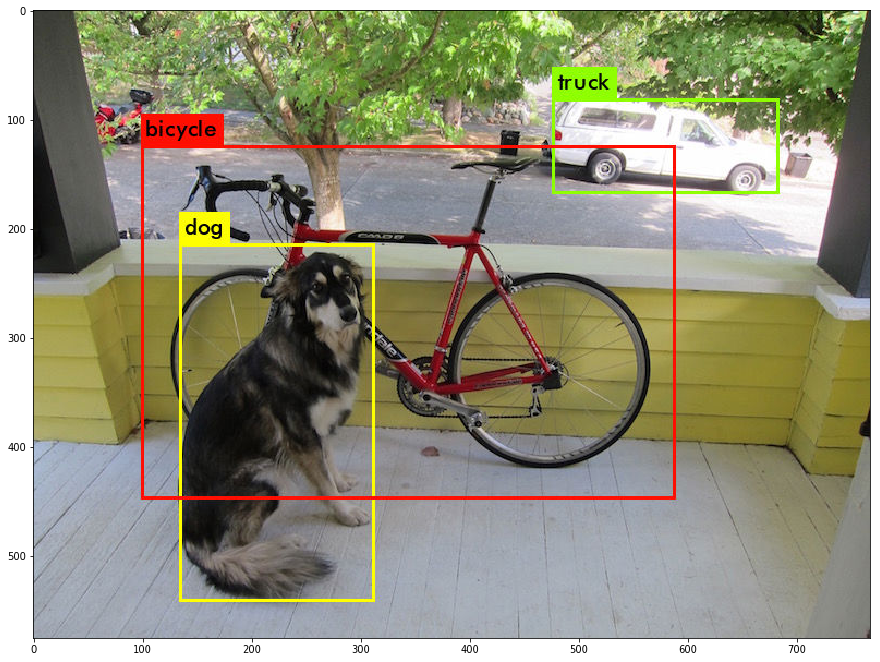

In [0]:
import matplotlib.pyplot as plt

img = cv2.imread("predictions.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,15))
plt.imshow(img_cvt)
plt.show()

In [0]:
!wget https://usatiki.ru/wp-content/uploads/2017/07/citaty-pro-sobak-2.jpg

--2019-06-04 07:26:21--  https://usatiki.ru/wp-content/uploads/2017/07/citaty-pro-sobak-2.jpg
Resolving usatiki.ru (usatiki.ru)... 104.27.129.231, 104.27.128.231, 2606:4700:30::681b:81e7, ...
Connecting to usatiki.ru (usatiki.ru)|104.27.129.231|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 43722 (43K) [image/jpeg]
Saving to: ‘citaty-pro-sobak-2.jpg’

citaty-pro-sobak-2. 100%[===================>]  42.70K  --.-KB/s    in 0.1s    

2019-06-04 07:26:23 (311 KB/s) - ‘citaty-pro-sobak-2.jpg’ saved [43722/43722]



In [0]:
!./darknet detect cfg/yolov3.cfg yolov3.weights citaty-pro-sobak-2.jpg

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32  0.639 BFLOPs
    1 conv     64  3 x 3 / 2   608 x 608 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    2 conv     32  1 x 1 / 1   304 x 304 x  64   ->   304 x 304 x  32  0.379 BFLOPs
    3 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    4 res    1                 304 x 304 x  64   ->   304 x 304 x  64
    5 conv    128  3 x 3 / 2   304 x 304 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    6 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
    7 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    8 res    5                 152 x 152 x 128   ->   152 x 152 x 128
    9 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
   10 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
   11 res    8                 152 x 

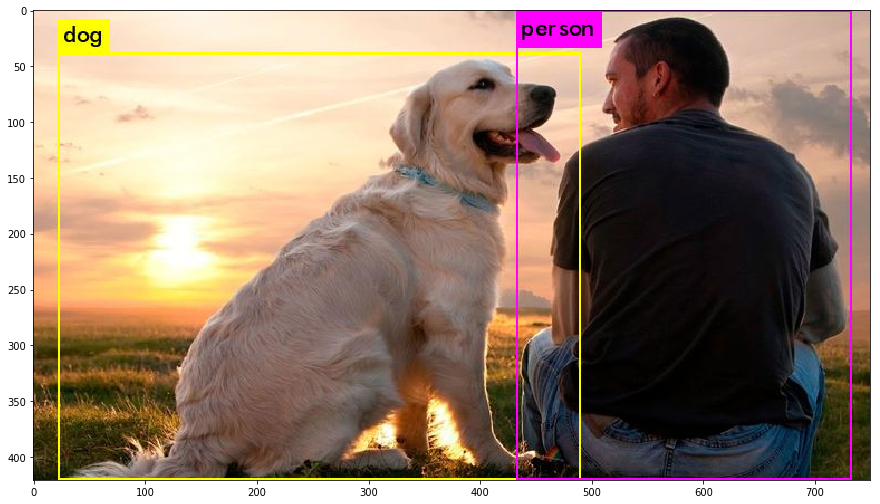

In [0]:
img = cv2.imread("predictions.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,15))
plt.imshow(img_cvt)
plt.show()

#получены предсказания на любом вашем изображении

--2019-06-04 07:27:02--  https://medialeaks.ru/wp-content/uploads/2017/10/cat1-600x400.jpg
Resolving medialeaks.ru (medialeaks.ru)... 149.210.219.32, 2a01:7c8:aaac:482::1
Connecting to medialeaks.ru (medialeaks.ru)|149.210.219.32|:443... failed: Connection timed out.
Connecting to medialeaks.ru (medialeaks.ru)|2a01:7c8:aaac:482::1|:443... failed: Network is unreachable.
layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32  0.639 BFLOPs
    1 conv     64  3 x 3 / 2   608 x 608 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    2 conv     32  1 x 1 / 1   304 x 304 x  64   ->   304 x 304 x  32  0.379 BFLOPs
    3 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    4 res    1                 304 x 304 x  64   ->   304 x 304 x  64
    5 conv    128  3 x 3 / 2   304 x 304 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    6 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64 

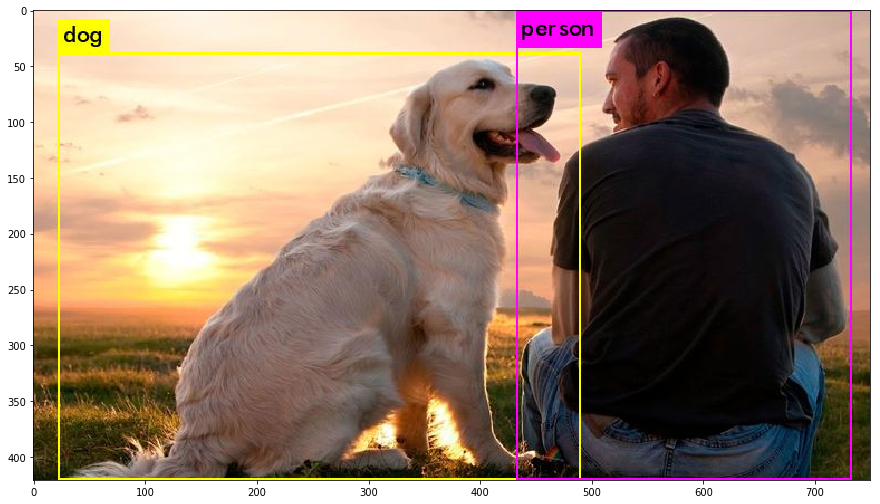

In [0]:
!wget https://medialeaks.ru/wp-content/uploads/2017/10/cat1-600x400.jpg
  
!./darknet detect cfg/yolov3.cfg yolov3.weights cat1-600x400.jpg

img = cv2.imread("predictions.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,15))
plt.imshow(img_cvt)
plt.show()

#найдена кратинка, где у нейросети есть ложные срабатывания

--2019-06-04 07:29:27--  https://www.moya-planeta.ru/files/holder/91/03/9103d0f27c80e3ea538ac470c6f3ae5b.jpg
Resolving www.moya-planeta.ru (www.moya-planeta.ru)... 144.76.176.247
Connecting to www.moya-planeta.ru (www.moya-planeta.ru)|144.76.176.247|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 88672 (87K) [image/jpeg]
Saving to: ‘9103d0f27c80e3ea538ac470c6f3ae5b.jpg’

9103d0f27c80e3ea538 100%[===================>]  86.59K  81.4KB/s    in 1.1s    

2019-06-04 07:29:30 (81.4 KB/s) - ‘9103d0f27c80e3ea538ac470c6f3ae5b.jpg’ saved [88672/88672]

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32  0.639 BFLOPs
    1 conv     64  3 x 3 / 2   608 x 608 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    2 conv     32  1 x 1 / 1   304 x 304 x  64   ->   304 x 304 x  32  0.379 BFLOPs
    3 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    4 res    1        

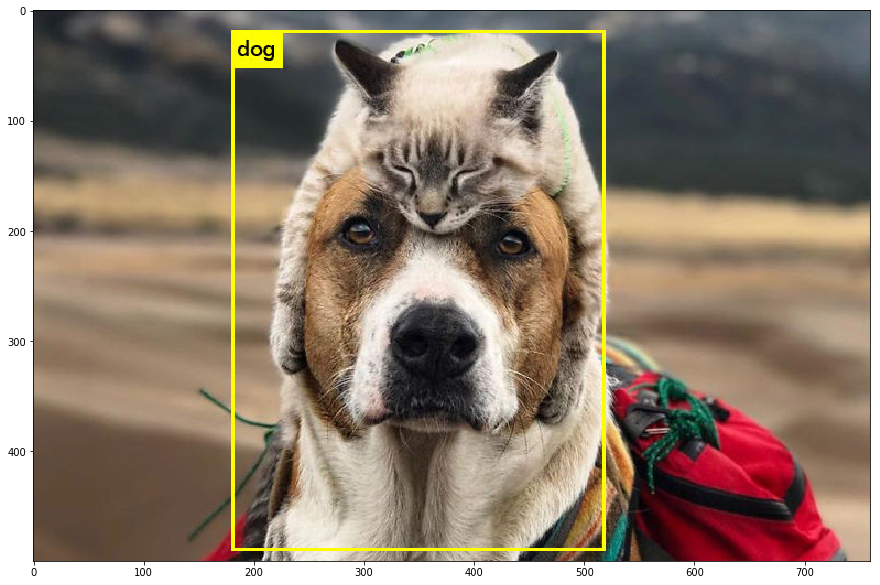

In [0]:
!wget https://www.moya-planeta.ru/files/holder/91/03/9103d0f27c80e3ea538ac470c6f3ae5b.jpg
  
!./darknet detect cfg/yolov3.cfg yolov3.weights 9103d0f27c80e3ea538ac470c6f3ae5b.jpg

img = cv2.imread("predictions.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,15))
plt.imshow(img_cvt)
plt.show()

#найдена картинка, где у нейросети есть пропуски в детекции

--2019-06-04 07:30:10--  https://i.ytimg.com/vi/wGNvNIz8jUU/maxresdefault.jpg
Resolving i.ytimg.com (i.ytimg.com)... 74.125.203.119, 64.233.188.119, 108.177.125.119, ...
Connecting to i.ytimg.com (i.ytimg.com)|74.125.203.119|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 185574 (181K) [image/jpeg]
Saving to: ‘maxresdefault.jpg’

maxresdefault.jpg   100%[===================>] 181.22K  --.-KB/s    in 0.002s  

2019-06-04 07:30:10 (71.3 MB/s) - ‘maxresdefault.jpg’ saved [185574/185574]

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32  0.639 BFLOPs
    1 conv     64  3 x 3 / 2   608 x 608 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    2 conv     32  1 x 1 / 1   304 x 304 x  64   ->   304 x 304 x  32  0.379 BFLOPs
    3 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    4 res    1                 304 x 304 x  64   ->   304 x 304 x  64
    5 conv 

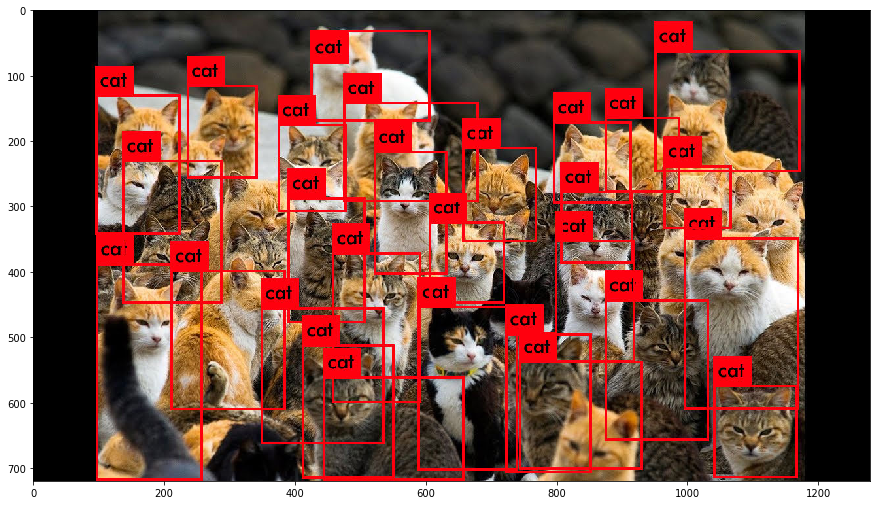

In [0]:
!wget https://i.ytimg.com/vi/wGNvNIz8jUU/maxresdefault.jpg
  
!./darknet detect cfg/yolov3.cfg yolov3.weights maxresdefault.jpg

img = cv2.imread("predictions.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,15))
plt.imshow(img_cvt)
plt.show()

#найдена картинка, где сеть детектировала успешно (ну, как по мне, так очень даже неплохо получилось, 
#учитывая, сколько тут объектов) все объекты, хотя они сильно перекрыватся

--2019-06-04 07:30:51--  http://girlusha.ru/data/_images/2018/cat-4.jpg
Resolving girlusha.ru (girlusha.ru)... 194.58.108.63
Connecting to girlusha.ru (girlusha.ru)|194.58.108.63|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 59707 (58K) [image/jpeg]
Saving to: ‘cat-4.jpg’

cat-4.jpg           100%[===================>]  58.31K  64.2KB/s    in 0.9s    

2019-06-04 07:30:53 (64.2 KB/s) - ‘cat-4.jpg’ saved [59707/59707]

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32  0.639 BFLOPs
    1 conv     64  3 x 3 / 2   608 x 608 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    2 conv     32  1 x 1 / 1   304 x 304 x  64   ->   304 x 304 x  32  0.379 BFLOPs
    3 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    4 res    1                 304 x 304 x  64   ->   304 x 304 x  64
    5 conv    128  3 x 3 / 2   304 x 304 x  64   ->   152 x 152 x 128  3.407 B

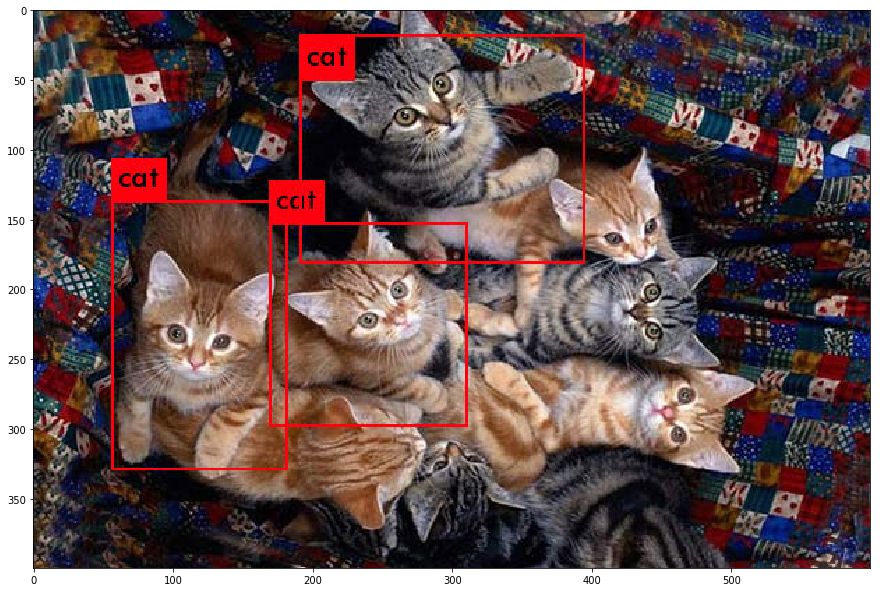

In [0]:
!wget http://girlusha.ru/data/_images/2018/cat-4.jpg
  
!./darknet detect cfg/yolov3.cfg yolov3.weights cat-4.jpg

img = cv2.imread("predictions.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,15))
plt.imshow(img_cvt)
plt.show()

#найдена картинка, где сеть детектировала (не) спешно все объекты, хотя они сильно перекрыватся

In [0]:
...

Ellipsis

### * Дополнительный этап 4 (10 баллов): обучение детектора на собственной выборке

<img src="https://i.ytimg.com/vi/Zdf7Afgfq8Q/maxresdefault.jpg" width=500 height=300>

В этом задании Вы по-желанию можете обучить свой детектор. Чтобы упростить задачу, вот примеры небольших датасетов, на которых можно обучить и протестировать (**10 баллов ставится за один из двух вариантов, за оба варианта двойной балл ставиться не будет**):

***1). Датасет игровых карт: https://github.com/EdjeElectronics/TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10***  

Репозиторий состоит из туториала по обучению детектора с помощью TF Object Detection API. Вы можете либо взять датасет из папки `/images` этого репозитория и обучить текущий YOLOv3 с помощью `train.py` (готовьтесь, предстоит повозиться с переводом разметки данных в нужный формат), либо же пройти тот туториал и обучить любую модель из TF Object Detection API на этом датасете.  

Главное: продемонстрировать работу вашего детектора не тестовых примерах с картами.

In [0]:
#Еще одна попытка побороть https://github.com/akozd/tensorflow_yolo_v3

os.chdir('/content/tensorflow_yolo_v3/')
!ls

detect.py	     models	    tensorboard    yolo_v3_detect_graph.png
example.jpg	     model_weights  training_data  yolo_v3_train_graph.png
example_yolo_v3.jpg  __pycache__    train.py
LICENSE		     README.md	    utils


In [0]:
!pip install tensorflow==1.10.1

     |████████████████████████████████| 58.4MB 22.0MB/s 
     |████████████████████████████████| 3.3MB 26.5MB/s 
     |████████████████████████████████| 573kB 42.4MB/s 
     |████████████████████████████████| 12.2MB 28.0MB/s 
ERROR: spacy 2.0.18 has requirement numpy>=1.15.0, but you'll have numpy 1.14.5 which is incompatible.
ERROR: magenta 0.3.19 has requirement tensorflow>=1.12.0, but you'll have tensorflow 1.10.1 which is incompatible.
ERROR: imgaug 0.2.9 has requirement numpy>=1.15.0, but you'll have numpy 1.14.5 which is incompatible.
ERROR: fastai 1.0.52 has requirement numpy>=1.15, but you'll have numpy 1.14.5 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: numpy 1.16.4
    Uninstalling numpy-1.16.4:
      Successfully uninstalled numpy-1.16.4
  Fo

In [0]:
import tensorflow as tf
tf.__version__

'1.10.1'

In [0]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 10478243813618038148]

In [0]:
import cv2
cv2.__version__

'3.4.3'

In [0]:
import numpy as np
np.__version__

'1.14.5'

In [0]:
import os
os.chdir('/content/tensorflow_yolo_v3/')
!ls

detect.py	     models	    tensorboard    yolo_v3_detect_graph.png
example.jpg	     model_weights  training_data  yolo_v3_train_graph.png
example_yolo_v3.jpg  __pycache__    train.py
LICENSE		     README.md	    utils


In [0]:
!python detect.py --path_to_input_image=training_data/images/img1.jpg

2019-06-04 07:32:49.465766: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
restoring model weights...
feeding image found at filepath:  training_data/images/img1.jpg
total inference time was: 3.66 seconds (that's 16.4 fps!)
image with detections saved as:  img1_yolo_v3.jpg


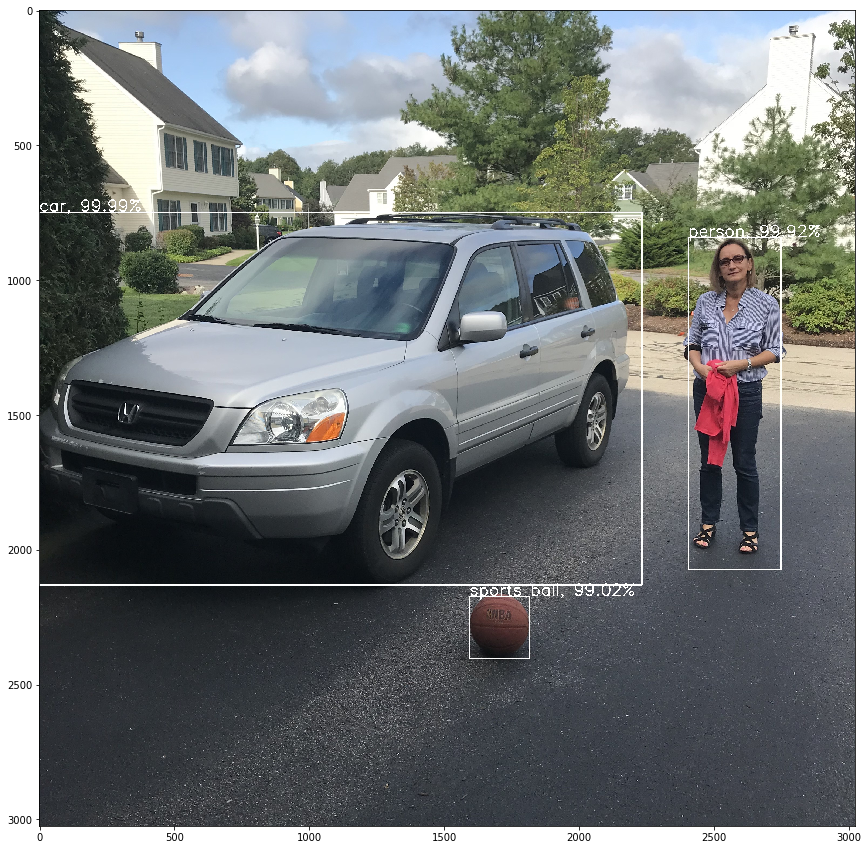

In [0]:
import matplotlib.pyplot as plt

img = cv2.imread("img1_yolo_v3.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,15))
plt.imshow(img_cvt)
plt.show()

In [0]:
#Вроде вышло!
#Проверим на прошлых картинках и эту сетку сразу

In [0]:
!wget https://usatiki.ru/wp-content/uploads/2017/07/citaty-pro-sobak-2.jpg

!python detect.py --path_to_input_image=citaty-pro-sobak-2.jpg

--2019-06-04 07:33:02--  https://usatiki.ru/wp-content/uploads/2017/07/citaty-pro-sobak-2.jpg
Resolving usatiki.ru (usatiki.ru)... 104.27.128.231, 104.27.129.231, 2606:4700:30::681b:81e7, ...
Connecting to usatiki.ru (usatiki.ru)|104.27.128.231|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 43722 (43K) [image/jpeg]
Saving to: ‘citaty-pro-sobak-2.jpg’

citaty-pro-sobak-2. 100%[===================>]  42.70K  --.-KB/s    in 0.1s    

2019-06-04 07:33:03 (311 KB/s) - ‘citaty-pro-sobak-2.jpg’ saved [43722/43722]

2019-06-04 07:33:12.815150: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
restoring model weights...
feeding image found at filepath:  citaty-pro-sobak-2.jpg
total inference time was: 3.79 seconds (that's 15.83 fps!)
image with detections saved as:  citaty-pro-sobak-2_yolo_v3.jpg


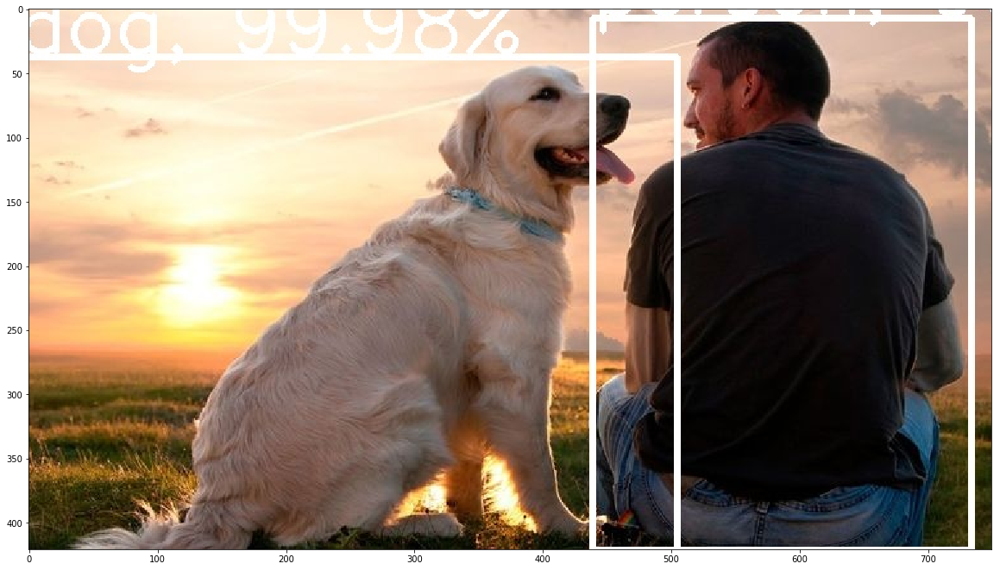

In [0]:
img = cv2.imread("citaty-pro-sobak-2_yolo_v3.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,20))
plt.imshow(img_cvt)
plt.show()

--2019-06-04 07:36:39--  https://medialeaks.ru/wp-content/uploads/2017/10/cat1-600x400.jpg
Resolving medialeaks.ru (medialeaks.ru)... 149.210.219.32, 2a01:7c8:aaac:482::1
Connecting to medialeaks.ru (medialeaks.ru)|149.210.219.32|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 50414 (49K) [image/jpeg]
Saving to: ‘cat1-600x400.jpg’

cat1-600x400.jpg    100%[===================>]  49.23K   189KB/s    in 0.3s    

2019-06-04 07:36:41 (189 KB/s) - ‘cat1-600x400.jpg’ saved [50414/50414]

2019-06-04 07:36:47.790244: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
restoring model weights...
feeding image found at filepath:  cat1-600x400.jpg
total inference time was: 3.88 seconds (that's 15.47 fps!)
image with detections saved as:  cat1-600x400_yolo_v3.jpg


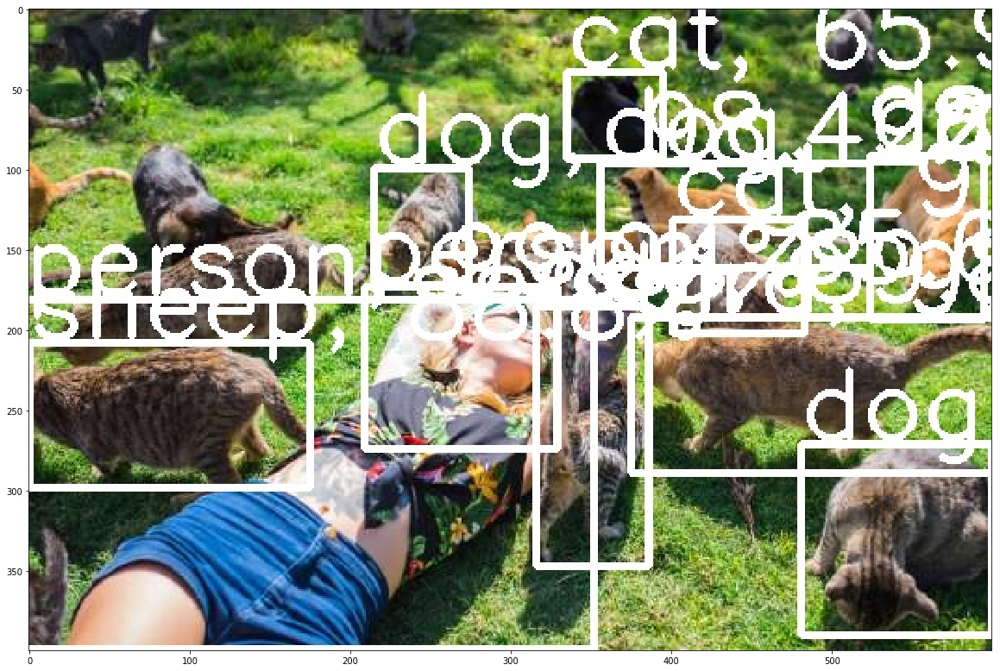

In [0]:
!wget https://medialeaks.ru/wp-content/uploads/2017/10/cat1-600x400.jpg
  
!python detect.py --path_to_input_image=cat1-600x400.jpg

img = cv2.imread("cat1-600x400_yolo_v3.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

--2019-06-04 07:37:04--  https://www.moya-planeta.ru/files/holder/91/03/9103d0f27c80e3ea538ac470c6f3ae5b.jpg
Resolving www.moya-planeta.ru (www.moya-planeta.ru)... 144.76.176.247
Connecting to www.moya-planeta.ru (www.moya-planeta.ru)|144.76.176.247|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 88672 (87K) [image/jpeg]
Saving to: ‘9103d0f27c80e3ea538ac470c6f3ae5b.jpg’

9103d0f27c80e3ea538 100%[===================>]  86.59K   109KB/s    in 0.8s    

2019-06-04 07:37:07 (109 KB/s) - ‘9103d0f27c80e3ea538ac470c6f3ae5b.jpg’ saved [88672/88672]

2019-06-04 07:37:14.581006: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
restoring model weights...
feeding image found at filepath:  9103d0f27c80e3ea538ac470c6f3ae5b.jpg
total inference time was: 3.79 seconds (that's 15.82 fps!)
image with detections saved as:  9103d0f27c80e3ea538ac470c6f3ae5b_yolo_v3.jpg


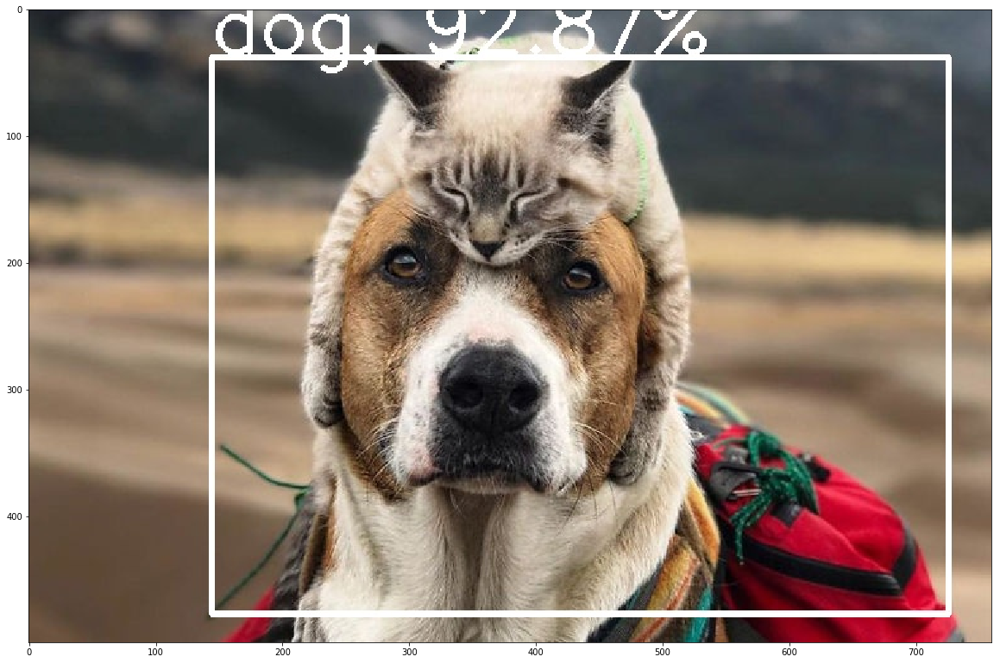

In [0]:
!wget https://www.moya-planeta.ru/files/holder/91/03/9103d0f27c80e3ea538ac470c6f3ae5b.jpg
  
!python detect.py --path_to_input_image=9103d0f27c80e3ea538ac470c6f3ae5b.jpg

img = cv2.imread("9103d0f27c80e3ea538ac470c6f3ae5b_yolo_v3.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

--2019-06-04 07:37:27--  https://i.ytimg.com/vi/wGNvNIz8jUU/maxresdefault.jpg
Resolving i.ytimg.com (i.ytimg.com)... 64.233.188.119, 108.177.125.119, 74.125.204.119, ...
Connecting to i.ytimg.com (i.ytimg.com)|64.233.188.119|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 185574 (181K) [image/jpeg]
Saving to: ‘maxresdefault.jpg’

maxresdefault.jpg   100%[===================>] 181.22K  --.-KB/s    in 0.002s  

2019-06-04 07:37:27 (78.2 MB/s) - ‘maxresdefault.jpg’ saved [185574/185574]

2019-06-04 07:37:35.388415: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
restoring model weights...
feeding image found at filepath:  maxresdefault.jpg
total inference time was: 3.79 seconds (that's 15.83 fps!)
image with detections saved as:  maxresdefault_yolo_v3.jpg


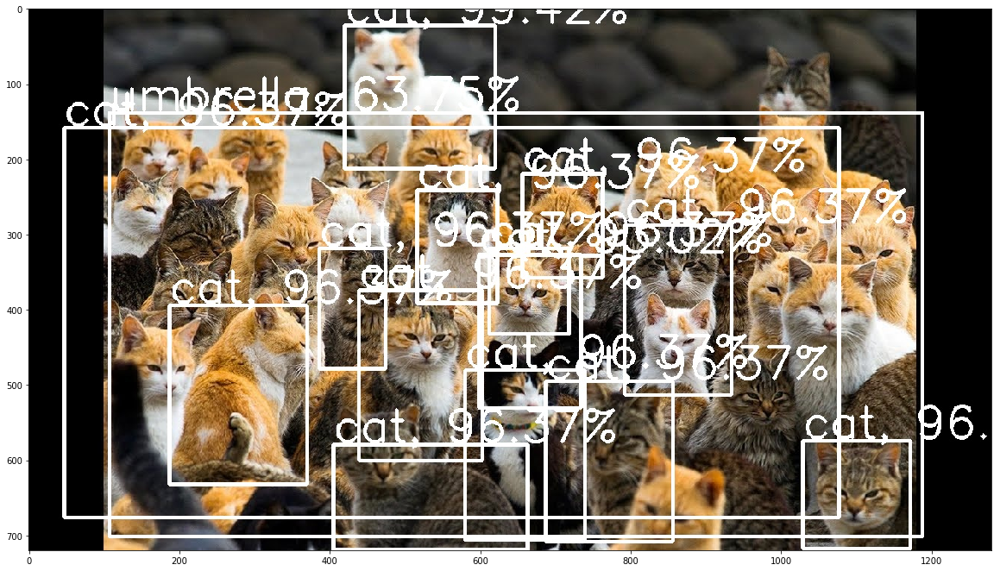

In [0]:
!wget https://i.ytimg.com/vi/wGNvNIz8jUU/maxresdefault.jpg
  
!python detect.py --path_to_input_image=maxresdefault.jpg

img = cv2.imread("maxresdefault_yolo_v3.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

--2019-06-04 07:37:48--  http://girlusha.ru/data/_images/2018/cat-4.jpg
Resolving girlusha.ru (girlusha.ru)... 194.58.108.63
Connecting to girlusha.ru (girlusha.ru)|194.58.108.63|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 59707 (58K) [image/jpeg]
Saving to: ‘cat-4.jpg’

cat-4.jpg           100%[===================>]  58.31K  63.8KB/s    in 0.9s    

2019-06-04 07:37:49 (63.8 KB/s) - ‘cat-4.jpg’ saved [59707/59707]

2019-06-04 07:37:57.361916: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
restoring model weights...
feeding image found at filepath:  cat-4.jpg
total inference time was: 3.77 seconds (that's 15.9 fps!)
image with detections saved as:  cat-4_yolo_v3.jpg


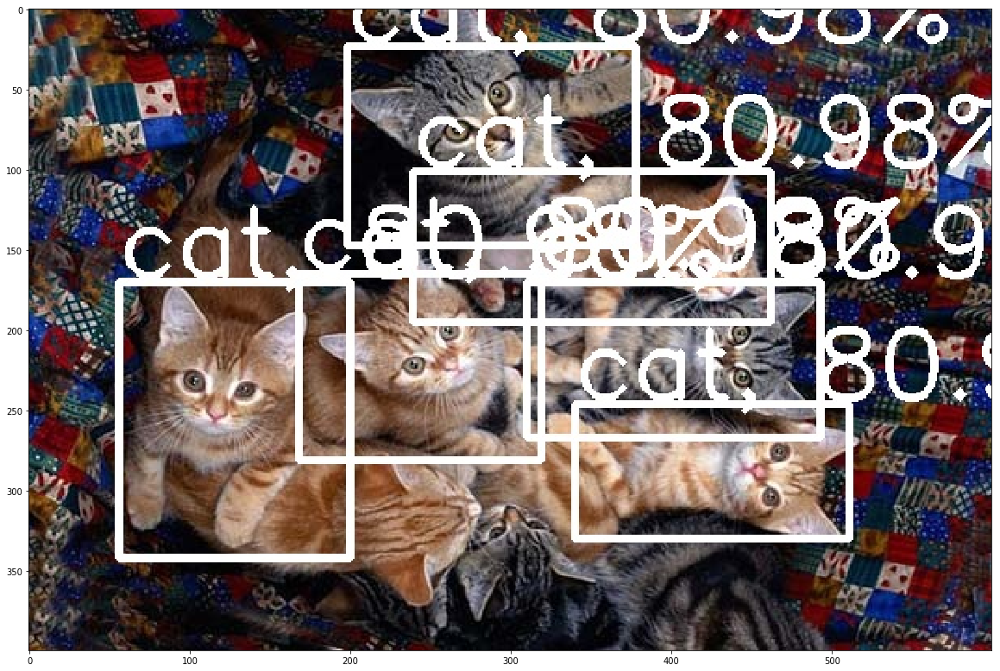

In [0]:
!wget http://girlusha.ru/data/_images/2018/cat-4.jpg
  
!python detect.py --path_to_input_image=cat-4.jpg

img = cv2.imread("cat-4_yolo_v3.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

In [0]:
!python train.py --help

usage: train.py [-h] [--train_from_checkpoint TRAIN_FROM_CHECKPOINT]
                [--class_path CLASS_PATH] [--anchors_path ANCHORS_PATH]
                [--data_path DATA_PATH] [--input_height INPUT_HEIGHT]
                [--input_width INPUT_WIDTH] [--batch_size BATCH_SIZE]
                [--max_num_boxes_per_image MAX_NUM_BOXES_PER_IMAGE]
                [--num_training_epochs NUM_TRAINING_EPOCHS]
                [--learning_rate LEARNING_RATE]
                [--ignore_threshold IGNORE_THRESHOLD]
                [--train_val_data_split TRAIN_VAL_DATA_SPLIT]
                [--train_save_path TRAIN_SAVE_PATH] [--model_name MODEL_NAME]
                [--tensorboard_save_path TENSORBOARD_SAVE_PATH]
                [--test_model_overfit [TEST_MODEL_OVERFIT]]
                [--save_every_x_iterations SAVE_EVERY_X_ITERATIONS]
                [--log_every_x_iterations LOG_EVERY_X_ITERATIONS]

optional arguments:
  -h, --help            show this help message and exit
  --train_from

In [0]:
!git clone https://github.com/EdjeElectronics/TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10.git

Cloning into 'TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10'...
remote: Enumerating objects: 1045, done.
remote: Total 1045 (delta 0), reused 0 (delta 0), pack-reused 1045
Receiving objects: 100% (1045/1045), 57.59 MiB | 9.89 MiB/s, done.
Resolving deltas: 100% (515/515), done.


In [0]:
#Посмотрим, что выдаст сетка если ничего не обучать

2019-06-04 07:38:51.633472: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
restoring model weights...
feeding image found at filepath:  TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/test/IMG_2383.JPG
total inference time was: 3.81 seconds (that's 15.76 fps!)
image with detections saved as:  IMG_2383_yolo_v3.JPG


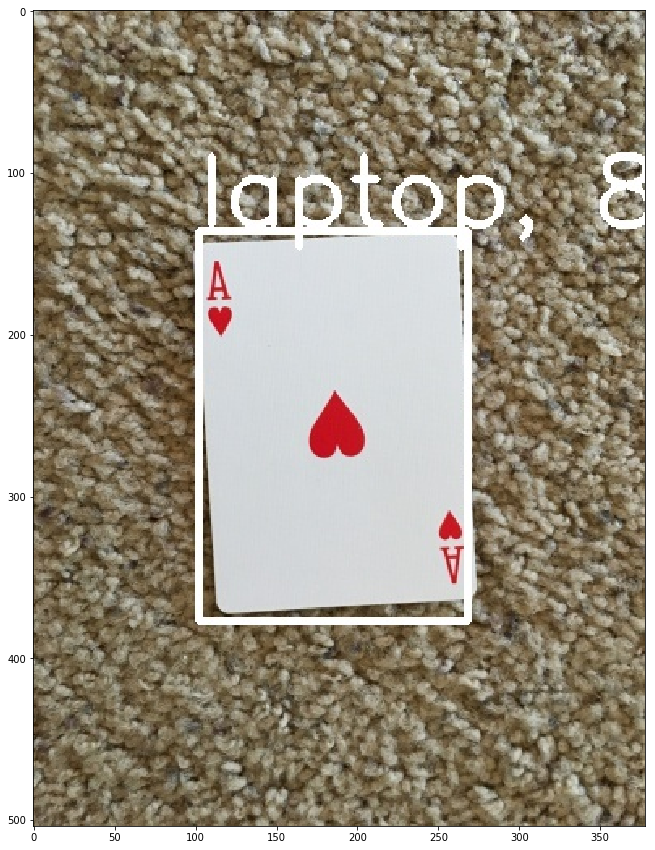

In [0]:
!python detect.py --path_to_input_image=TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/test/IMG_2383.JPG

img = cv2.imread("IMG_2383_yolo_v3.JPG")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

In [0]:
#нууу..не очень то похоже...придется учить

In [0]:
#создаем новый файлик с разметкой классов и заглушками, чтобы наш файл совпал по размерности с оригиналом
#и нам не пришлось ничего менять в самой сетке...будет не идеально, но надеюсь - сработает

f= open("utils/new_coco_classes.txt","w+")

for i in range(len(['ace', 'jack', 'king', 'nine', 'queen', 'ten'])):
  f.write(['ace', 'jack', 'king', 'nine', 'queen', 'ten'][i]+'\n')
  
for i in range(74):
  f.write('zaglushka \n')
  
f.close() 

In [0]:
#смотрим какие данные мы скачали
import pandas as pd

new_data = pd.read_csv('TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/train_labels.csv')

new_data.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,cam_image1.jpg,480,270,queen,173,24,260,137
1,cam_image1.jpg,480,270,queen,165,135,253,251
2,cam_image1.jpg,480,270,ten,255,96,337,208
3,cam_image10.jpg,960,540,ten,501,116,700,353
4,cam_image10.jpg,960,540,queen,261,124,453,370


In [0]:
new_data.shape

(527, 8)

In [0]:
#преобразуем данные в нужный формат для обучения

my_dict = {'ace': 0,
           'jack': 1,
           'king': 2,
           'nine': 3,
           'queen': 4,
           'ten': 5}

path = 'TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/train/'

f= open("training_data/new_image_paths_and_box_info.txt","w+")

name = new_data.filename[0]

sample = '%s,%s,%s,%s,%s' %(new_data['xmin'][0], new_data['ymin'][0], new_data['xmax'][0], new_data['ymax'][0], my_dict[new_data['class'][0]])

for i in range(1, new_data.shape[0]):
  
  if new_data.filename[i] != name:
    
    f.write('%s%s %s\n' %(path,name, sample) )
    
    name = new_data.filename[i]
  
    sample = '%s,%s,%s,%s,%s' %(new_data['xmin'][i], new_data['ymin'][i], new_data['xmax'][i], new_data['ymax'][i], my_dict[new_data['class'][i]])
    
  else:
    
    sample = sample+' %s,%s,%s,%s,%s' %(new_data['xmin'][i], new_data['ymin'][i], new_data['xmax'][i], new_data['ymax'][i], my_dict[new_data['class'][i]])
  
f.close() 

In [37]:
#запустим сетку учиться с начальными весами из оригинальной модели

!python train.py --train_from_checkpoint=model_weights/coco_pretrained_weights.ckpt --class_path=utils/new_coco_classes.txt --data_path=training_data/new_image_paths_and_box_info.txt --num_training_epochs=15 --log_every_x_iterations=5 \
--train_save_path=new_model_weights/ --model_name=new_model.ckpt --batch_size=128 --save_every_x_iterations=5

#Сетка училась слишком долго, пришлось оборвать процесс, но для результата должно хватить
# Посмотрим, как себя ведет наша подтюненная сетка на картинках из трейна

--info--
model weights will be saved with filename:  new_model.ckpt
tensorboard event files located at path:  tensorboard/tensorboard_train/
2019-06-04 08:30:10.895589: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
restoring weights from checkpoint:  model_weights/coco_pretrained_weights.ckpt
beginning to train the model...
2019-06-04 08:30:17.516873: W tensorflow/core/framework/allocator.cc:108] Allocation of 664535040 exceeds 10% of system memory.
2019-06-04 08:30:25.196663: W tensorflow/core/framework/allocator.cc:108] Allocation of 664535040 exceeds 10% of system memory.
2019-06-04 08:30:25.732741: W tensorflow/core/framework/allocator.cc:108] Allocation of 670940160 exceeds 10% of system memory.
tcmalloc: large alloc 1495285760 bytes == 0x2a870000 @  0x7f36dec501e7 0x7f36d1a01925 0x7f36d3d8b3f9 0x7f36d3d97ec5 0x7f36d3db78f4 0x7f36d3db9400 0x7f36d3dbb97c 0x7f36cfac1fa7 0x7f36cfa78131

In [60]:
!python detect.py --path_to_input_image=TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/train/cam_image3.jpg --class_path=utils/new_coco_classes.txt --path_to_trained_model=new_model_weights/new_model.ckpt-91

img = cv2.imread("TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/train/cam_image3.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

img = cv2.imread('cam_image3'+"_yolo_v3."+"jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

#нууу...что-то моя недоучка определенно находит!

Output hidden; open in https://colab.research.google.com to view.

2019-06-04 12:33:48.391875: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
restoring model weights...
feeding image found at filepath:  TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/test/IMG_2383.JPG
total inference time was: 3.74 seconds (that's 16.06 fps!)
image with detections saved as:  IMG_2383_yolo_v3.JPG


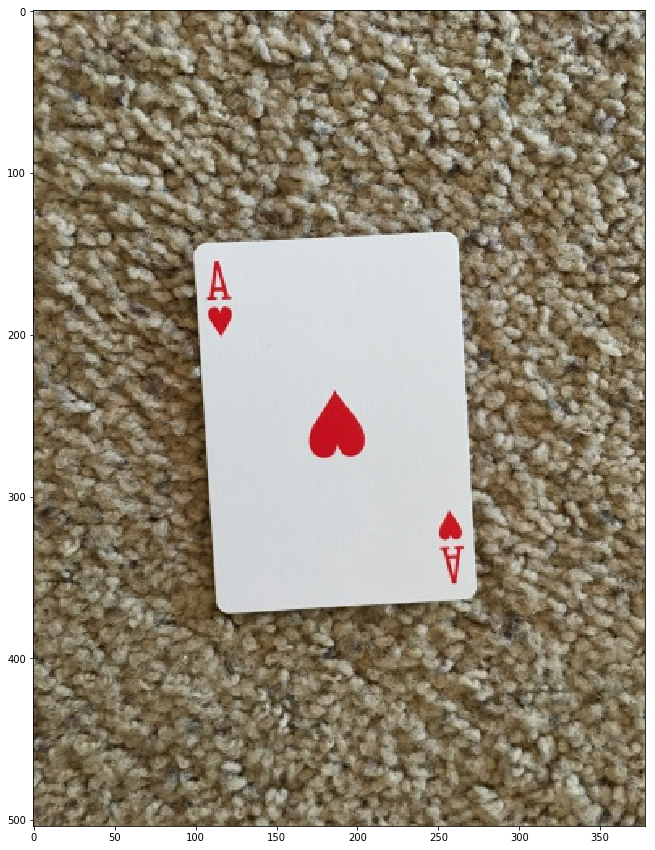

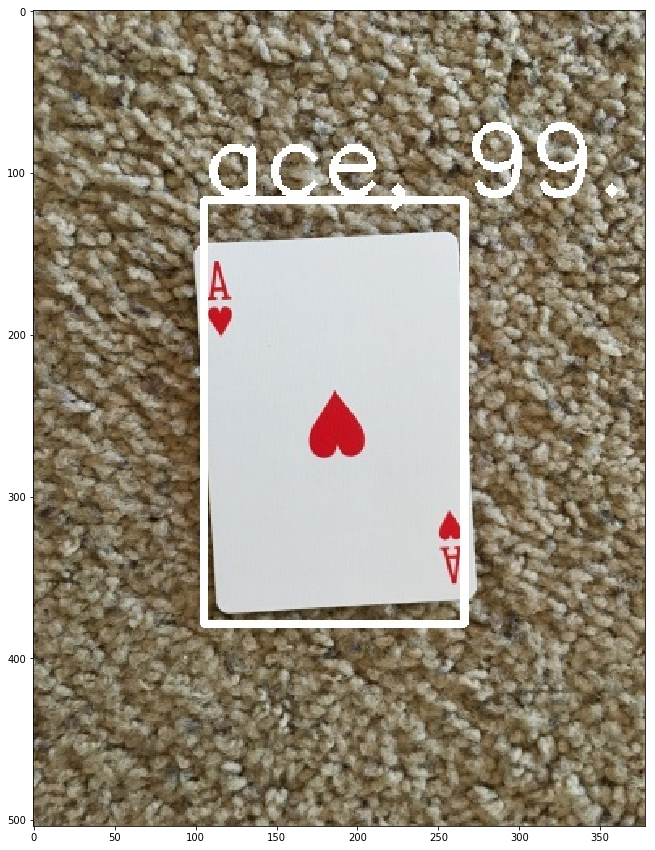

In [40]:
#проверим нашу прошлую картинку из теста

!python detect.py --path_to_input_image=TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/test/IMG_2383.JPG --class_path=utils/new_coco_classes.txt --path_to_trained_model=new_model_weights/new_model.ckpt-91

img = cv2.imread("TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/test/IMG_2383.JPG")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

img = cv2.imread('IMG_2383'+"_yolo_v3."+"JPG")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

# хорошее качество картинки (наверное) позволило правильно определить карту

# и еще пару примеров из теста глянем

2019-06-04 12:34:35.707939: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
restoring model weights...
feeding image found at filepath:  TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/test/IMG_2479.JPG
total inference time was: 3.76 seconds (that's 15.97 fps!)
image with detections saved as:  IMG_2479_yolo_v3.JPG


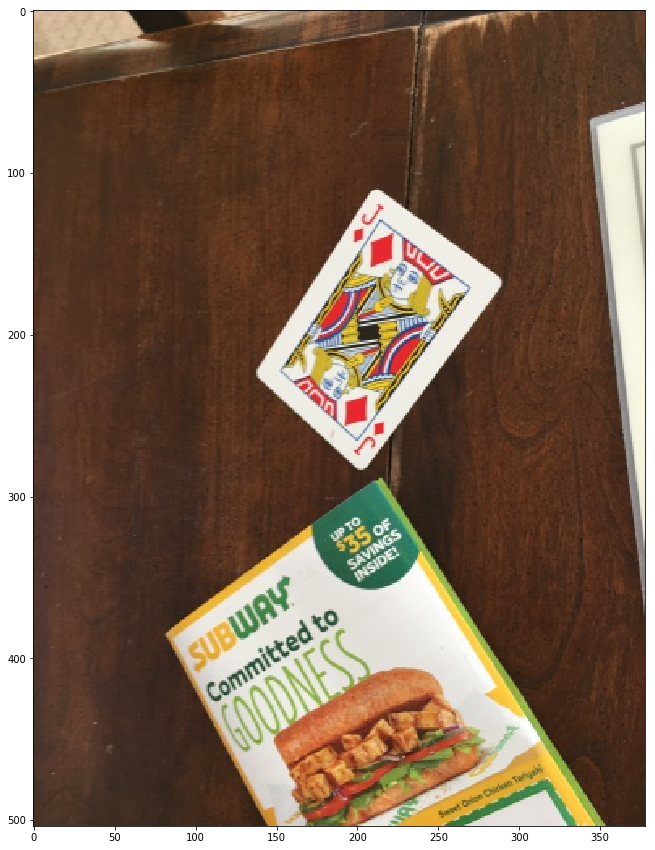

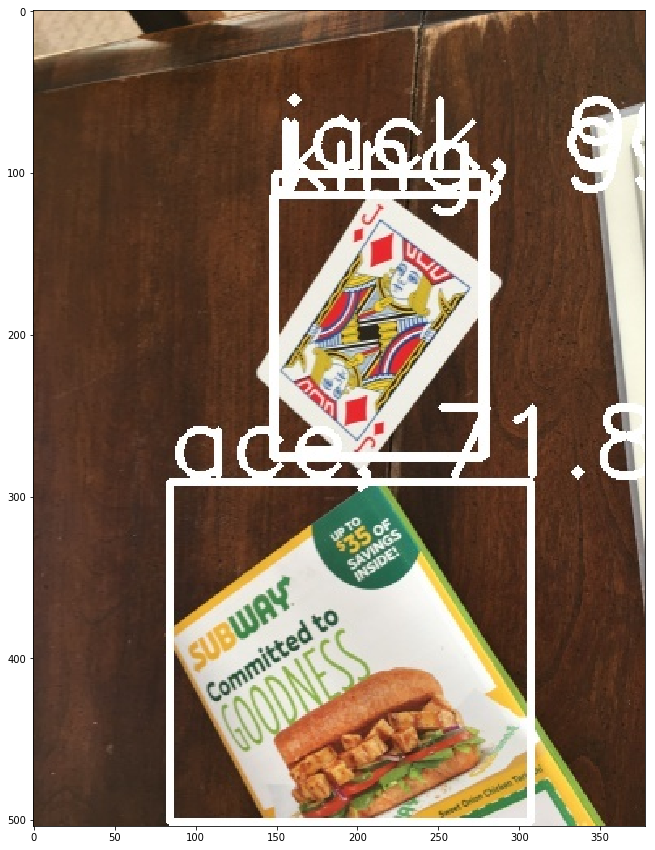

In [41]:
!python detect.py --path_to_input_image=TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/test/IMG_2479.JPG --class_path=utils/new_coco_classes.txt --path_to_trained_model=new_model_weights/new_model.ckpt-91

img = cv2.imread("TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/test/IMG_2479.JPG")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

img = cv2.imread('IMG_2479'+"_yolo_v3."+"JPG")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

2019-06-04 12:34:53.439305: I tensorflow/core/platform/cpu_feature_guard.cc:141] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
restoring model weights...
feeding image found at filepath:  TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/test/IMG_2647.JPG
total inference time was: 3.79 seconds (that's 15.83 fps!)
image with detections saved as:  IMG_2647_yolo_v3.JPG


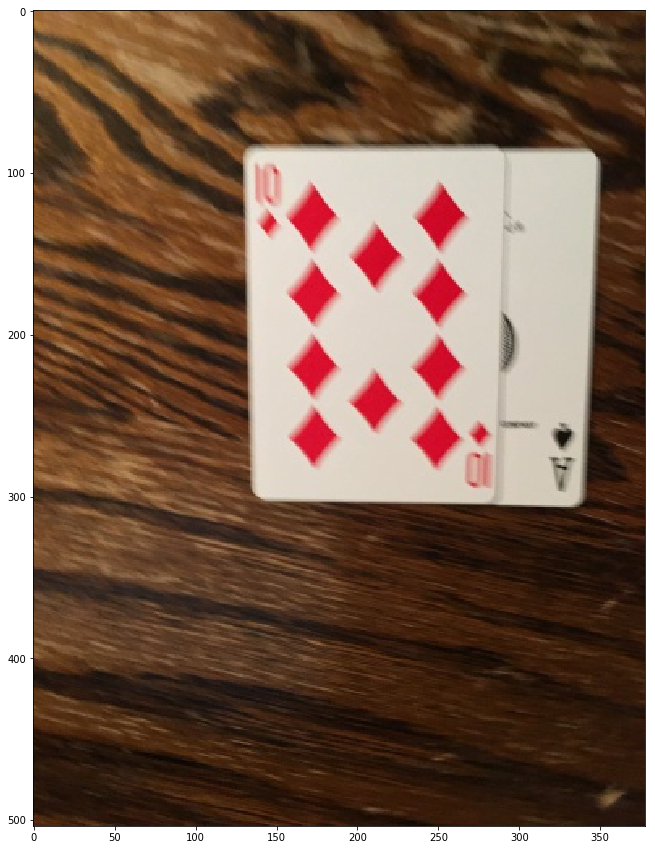

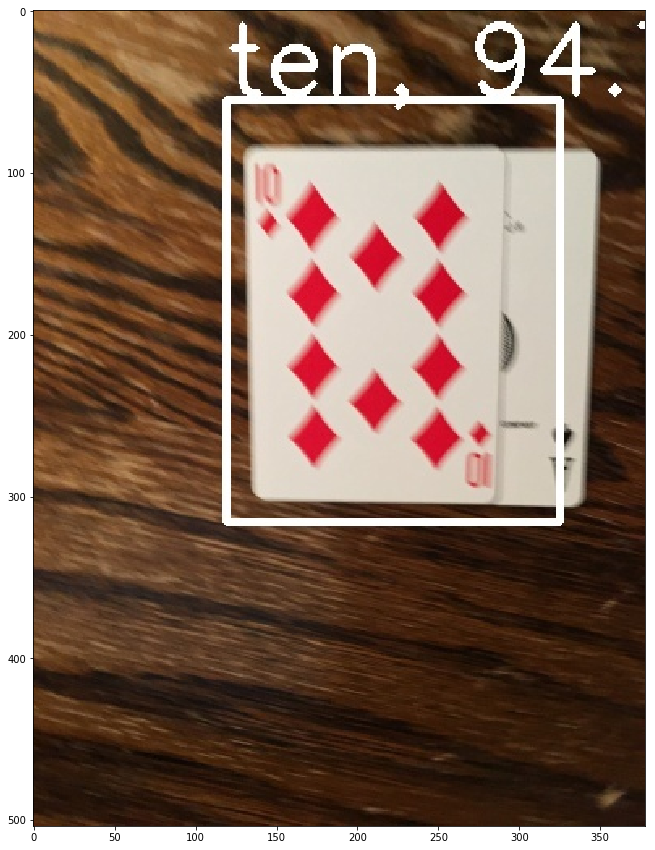

In [42]:
!python detect.py --path_to_input_image=TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/test/IMG_2647.JPG --class_path=utils/new_coco_classes.txt --path_to_trained_model=new_model_weights/new_model.ckpt-91

img = cv2.imread("TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images/test/IMG_2647.JPG")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

img = cv2.imread('IMG_2647'+"_yolo_v3."+"JPG")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,15))
plt.imshow(img_cvt)
plt.show()

In [0]:
#ну...что-то оно определенно нашло :) может потом дам ей поучиться подольше

In [0]:
...

**2). Датасет из картинок со снитчем из Гарри Поттера, ссылка на статью с подробным описанием задачи: https://apptractor.ru/develop/syigraem-v-kviddich-s-tensorflow-object-detection-api.html**

В качестве результата нужно показать тестовые изображения, на которых верно детектирован снитч.

In [0]:
...

In [0]:
<Торжественно клянусь, что совершаю только шалость>

In [0]:
...

Также есть **ещё два пути, которые должны сработать**, если не работает то, что описано в домашнем ноутбуке:  
а). **Darkflow** -- репозиторий с разными версиями YOLO, в Readme есть про то, как обучать: https://github.com/thtrieu/darkflow  
б). **Darknet** -- фреймворк на С++ c авторским YOLOv3 (от Джозефа Редмона). Можно обучить детектор, следуя инструкциям на его сайте: https://pjreddie.com/darknet/yolo/

In [0]:
...

<h3 style="text-align: center;"><b>Полезные ссылки</b></h3>

1. https://github.com/qqwweee/keras-yolo3
2. https://github.com/ayooshkathuria/pytorch-yolo-v3
3. https://github.com/eriklindernoren/PyTorch-YOLOv3
4. https://github.com/maiminh1996/YOLOv3-tensorflow
5. https://github.com/ultralytics/yolov3
6. https://www.analyticsvidhya.com/blog/2018/12/practical-guide-object-detection-yolo-framewor-python/?utm_source=feedburner&utm_medium=email&utm_campaign=Feed%3A+AnalyticsVidhya+%28Analytics+Vidhya%29